In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
!pip install -q tflite-model-maker
!pip install -q pycocotools



     |████████████████████████████████| 616 kB 4.3 MB/s 
     |████████████████████████████████| 120 kB 37.4 MB/s 
     |████████████████████████████████| 77 kB 7.9 MB/s 
     |████████████████████████████████| 3.4 MB 77.4 MB/s 
     |████████████████████████████████| 1.1 MB 58.5 MB/s 
     |████████████████████████████████| 840 kB 70.5 MB/s 
     |████████████████████████████████| 6.4 MB 81.0 MB/s 
     |████████████████████████████████| 1.1 MB 25.3 MB/s 
     |████████████████████████████████| 1.2 MB 64.8 MB/s 
     |████████████████████████████████| 87 kB 9.3 MB/s 
     |████████████████████████████████| 234 kB 82.3 MB/s 
     |████████████████████████████████| 596 kB 70.3 MB/s 
     |████████████████████████████████| 25.3 MB 91.8 MB/s 
     |████████████████████████████████| 47.7 MB 1.2 MB/s 
     |████████████████████████████████| 99 kB 11.7 MB/s 
     |████████████████████████████████| 352 kB 60.1 MB/s 
     |████████████████████████████████| 462 kB 59.6 MB/s 
     |█████████████

In [ ]:
!pip install imageai

In [ ]:
!pip install pillow==7.1.0

In [3]:
import numpy as np
import os

from tflite_model_maker.config import ExportFormat
from tflite_model_maker import model_spec
from tflite_model_maker import object_detector
import time

import tensorflow as tf
assert tf.__version__.startswith('2')

tf.get_logger().setLevel('ERROR')
from absl import logging
logging.set_verbosity(logging.ERROR)
from tensorflow import keras

In [4]:
train_image_dir = '/content/drive/MyDrive/machine leararing /dataset/finally dataset/3cur-4/train/image'
train_annotation_dir = '/content/drive/MyDrive/machine leararing /dataset/finally dataset/3cur-4/train/anaotation'
validate_image_dir = '/content/drive/MyDrive/machine leararing /dataset/finally dataset/3cur-4/valid/images'
validate_anaotation_dir = '/content/drive/MyDrive/machine leararing /dataset/finally dataset/3cur-4/valid/anaotation'

In [5]:
train_dir = object_detector.DataLoader.from_pascal_voc(train_image_dir, train_annotation_dir, label_map={1:"10", 2: "20",3:"50",4:"100",5:"200",6:"500",7:"2000"})



In [6]:
print(len(train_dir))

3189


In [7]:
validate_dir = object_detector.DataLoader.from_pascal_voc(validate_image_dir, validate_anaotation_dir, label_map={1:"10", 2:"20",3:"50",4:"100",5:"200",6:"500",7:"2000"})

In [8]:
print(len(validate_dir))

386


In [9]:
spec = model_spec.get('efficientdet_lite0')

In [11]:
start = time.time()
model = object_detector.create(train_dir, 
                               model_spec=spec, 
                               epochs=10, 
                               batch_size=32, 
                               train_whole_model=True, 
                               validation_data=validate_dir)
end = time.time()

Epoch 1/10
99/99 [==============================] - 91s 626ms/step - det_loss: 1.3956 - cls_loss: 1.0198 - box_loss: 0.0075 - reg_l2_loss: 0.0639 - loss: 1.4595 - learning_rate: 0.0240 - gradient_norm: 1.1260 - val_det_loss: 1.6180 - val_cls_loss: 1.2790 - val_box_loss: 0.0068 - val_reg_l2_loss: 0.0641 - val_loss: 1.6821
Epoch 2/10
99/99 [==============================] - 61s 613ms/step - det_loss: 0.6723 - cls_loss: 0.5243 - box_loss: 0.0030 - reg_l2_loss: 0.0644 - loss: 0.7367 - learning_rate: 0.0372 - gradient_norm: 1.8011 - val_det_loss: 0.9059 - val_cls_loss: 0.7327 - val_box_loss: 0.0035 - val_reg_l2_loss: 0.0647 - val_loss: 0.9706
Epoch 3/10
99/99 [==============================] - 62s 625ms/step - det_loss: 0.4957 - cls_loss: 0.3823 - box_loss: 0.0023 - reg_l2_loss: 0.0650 - loss: 0.5607 - learning_rate: 0.0328 - gradient_norm: 1.7563 - val_det_loss: 0.8804 - val_cls_loss: 0.7420 - val_box_loss: 0.0028 - val_reg_l2_loss: 0.0652 - val_loss: 0.9456
Epoch 4/10
99/99 [=============

In [12]:
print("The time of execution of training is :", end-start)

The time of execution of training is : 685.2480716705322


In [15]:
start = time.time()
loss = model.evaluate(validate_dir)
print(loss)
end = time.time()


7/7 [==============================] - 18s 791ms/step

{'AP': 0.76884097, 'AP50': 0.90652007, 'AP75': 0.8573226, 'APs': -1.0, 'APm': 0.5617402, 'APl': 0.7843222, 'ARmax1': 0.729664, 'ARmax10': 0.8257588, 'ARmax100': 0.8329694, 'ARs': -1.0, 'ARm': 0.67576534, 'ARl': 0.84541667, 'AP_/10': 0.75654393, 'AP_/20': 0.7427486, 'AP_/50': 0.74547064, 'AP_/100': 0.8391821, 'AP_/200': 0.7494089, 'AP_/500': 0.82292825, 'AP_/2000': 0.7256044}


In [14]:
print("The time of execution of evaluation is  :", end-start)

The time of execution of evaluation is  : 23.702960729599


In [ ]:
#model = object_detector.create(train_dir, model_spec=spec, epochs=30, batch_size=8, train_whole_model=True)

In [ ]:
model.export(export_dir='/content/drive/MyDrive/machine leararing /dataset/finally dataset/models/m1')

In [ ]:
import cv2

from PIL import Image

model_path = '/content/drive/MyDrive/machine leararing /dataset/finally dataset/models/model.tflite'

# Load the labels into a list
classes = ['???'] * model.model_spec.config.num_classes
label_map = model.model_spec.config.label_map
for label_id, label_name in label_map.as_dict().items():
  classes[label_id-1] = label_name

# Define a list of colors for visualization
COLORS = np.random.randint(0, 255, size=(len(classes), 3), dtype=np.uint8)

def preprocess_image(image_path, input_size):
  """Preprocess the input image to feed to the TFLite model"""
  img = tf.io.read_file(image_path)
  img = tf.io.decode_image(img, channels=3)
  img = tf.image.convert_image_dtype(img, tf.uint8)
  original_image = img
  resized_img = tf.image.resize(img, input_size)
  resized_img = resized_img[tf.newaxis, :]
  return resized_img, original_image


def set_input_tensor(interpreter, image):
  """Set the input tensor."""
  tensor_index = interpreter.get_input_details()[0]['index']
  input_tensor = interpreter.tensor(tensor_index)()[0]
  input_tensor[:, :] = image


def get_output_tensor(interpreter, index):
  """Retur the output tensor at the given index."""
  output_details = interpreter.get_output_details()[index]
  tensor = np.squeeze(interpreter.get_tensor(output_details['index']))
  return tensor


def detect_objects(interpreter, image, threshold):
  """Returns a list of detection results, each a dictionary of object info."""
  # Feed the input image to the model
  set_input_tensor(interpreter, image)
  interpreter.invoke()

  # Get all outputs from the model
  boxes = get_output_tensor(interpreter, 0)
  classes = get_output_tensor(interpreter, 1)
  scores = get_output_tensor(interpreter, 2)
  count = int(get_output_tensor(interpreter, 3))

  results = []
  for i in range(count):
    if scores[i] >= threshold:
      result = {
        'bounding_box': boxes[i],
        'class_id': classes[i],
        'score': scores[i]
      }
      results.append(result)
  return results


def run_odt_and_draw_results(image_path, interpreter, threshold=0.5):
  """Run object detection on the input image and draw the detection results"""
  # Load the input shape required by the model
  _, input_height, input_width, _ = interpreter.get_input_details()[0]['shape']

  # Load the input image and preprocess it
  preprocessed_image, original_image = preprocess_image(
      image_path, 
      (input_height, input_width)
    )

  # Run object detection on the input image
  results = detect_objects(interpreter, preprocessed_image, threshold=threshold)

  # Plot the detection results on the input image
  original_image_np = original_image.numpy().astype(np.uint8)
  for obj in results:
    # Convert the object bounding box from relative coordinates to absolute 
    # coordinates based on the original image resolution
    ymin, xmin, ymax, xmax = obj['bounding_box']
    xmin = int(xmin * original_image_np.shape[1])
    xmax = int(xmax * original_image_np.shape[1])
    ymin = int(ymin * original_image_np.shape[0])
    ymax = int(ymax * original_image_np.shape[0])

    # Find the class index of the current object
    class_id = int(obj['class_id'])

    # Draw the bounding box and label on the image
    color = [int(c) for c in COLORS[class_id]]
    cv2.rectangle(original_image_np, (xmin, ymin), (xmax, ymax), color, 2)
    # Make adjustments to make the label visible for all objects
    y = ymin - 15 if ymin - 15 > 15 else ymin + 15
    label = "{}: {:.0f}%".format(classes[class_id], obj['score'] * 100)
    cv2.putText(original_image_np, label, (xmin, y),
        cv2.FONT_HERSHEY_SIMPLEX, 0.5, color, 2)

  # Return the final image
  original_uint8 = original_image_np.astype(np.uint8)
  return original_uint8


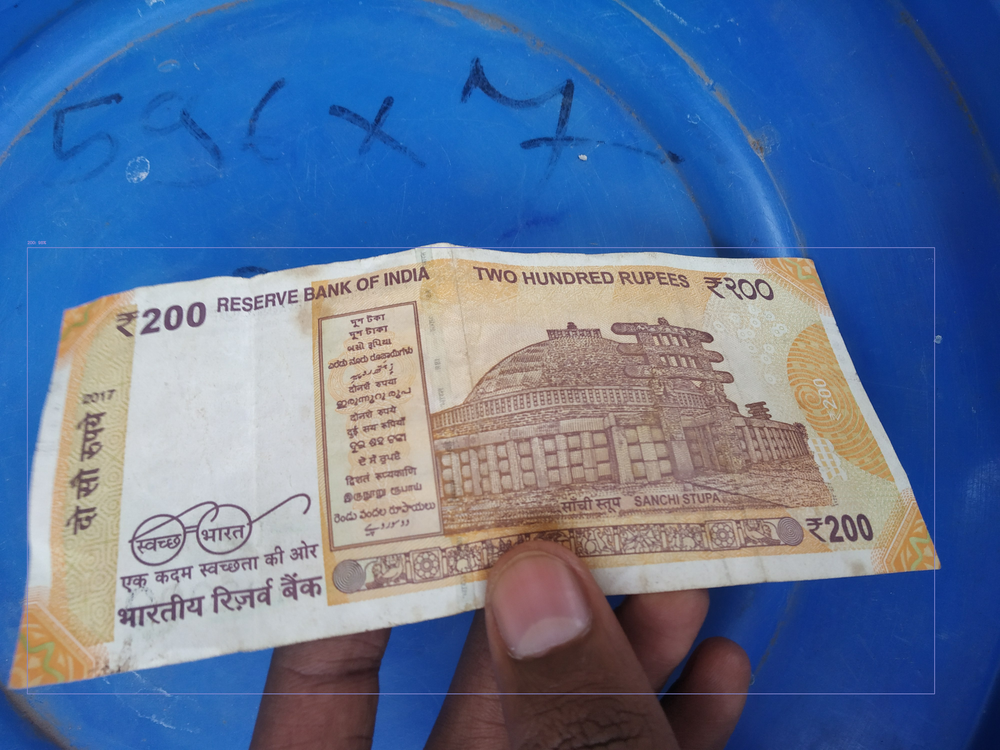

In [ ]:
INPUT_IMAGE_URL = "/content/drive/MyDrive/machine leararing /dataset/finally dataset/3cur-4/test/200.__206.jpg"
DETECTION_THRESHOLD = 0.7

# Load the TFLite model
interpreter = tf.lite.Interpreter(model_path=model_path)
interpreter.allocate_tensors()

# Run inference and draw detection result on the local copy of the original file
detection_result_image = run_odt_and_draw_results(
    INPUT_IMAGE_URL, 
    interpreter, 
    threshold=DETECTION_THRESHOLD
)

# Show the detection result
Image.fromarray(detection_result_image)
